# ST2195 Coursework - Python

### **Set up, import modules and data**

In [1]:
import os
import sqlite3
import calendar
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import calplot
from scipy.stats import chi2_contingency

In [2]:
# Set up settings
import warnings
warnings.filterwarnings('ignore')

from matplotlib.axes._axes import _log as matplotlib_axes_logger
matplotlib_axes_logger.setLevel('ERROR')

pd.set_option("display.max_columns", None)

sns.set(rc={"figure.dpi":1000, 'savefig.dpi':1000})
sns.set_context('notebook')
sns.set_style("ticks")

os.chdir("C:/Users/Joseph/Downloads/Joshua/SIM Year 2/Programing for Data Science/r/coursework/data")

Set up function to retrieve Week of Month

In [3]:
def get_week_of_month(date):
    cal = calendar.Calendar(6) # Week starts Sunday
    weeks = cal.monthdayscalendar(date.year, date.month) 
    for x in range(len(weeks)):
        if date.day in weeks[x]:
            return x + 1

Set up and open connection to the datebase

In [4]:
try:
    os.remove("flights2.db")
except OSError:
    pass

In [5]:
conn = sqlite3.connect("flights2.db")
c = conn.cursor()

Load and write data to database

In [6]:
carriers = pd.read_csv("carriers.csv")
airports = pd.read_csv("airports.csv")
plane_data = pd.read_csv("plane-data.csv")

carriers.to_sql("carriers", con = conn, index = False)
airports.to_sql("airports", con = conn, index = False)
plane_data.to_sql("plane_data", con = conn, index = False)

Load main data for preparation from CSV

In [7]:
flight_data = pd.read_csv("1995.csv")
for i in range(1996, 2001):
    data = pd.read_csv(str(i)+".csv")
    flight_data = pd.concat([flight_data, data], ignore_index = True)

In [8]:
flight_data.head(10)

,Year,Month,DayofMonth,DayOfWeek,DepTime,CRSDepTime,ArrTime,CRSArrTime,UniqueCarrier,FlightNum,TailNum,ActualElapsedTime,CRSElapsedTime,AirTime,ArrDelay,DepDelay,Origin,Dest,Distance,TaxiIn,TaxiOut,Cancelled,CancellationCode,Diverted,CarrierDelay,WeatherDelay,NASDelay,SecurityDelay,LateAircraftDelay
0,1995,1,6,5,657.0,645,952.0,937,UA,482,N7298U,115.0,112.0,83.0,15.0,12.0,ORD,PHL,678.0,7,25,0,NaN,0,NaN,NaN,NaN,NaN,NaN
1,1995,1,7,6,648.0,645,938.0,937,UA,482,N7449U,110.0,112.0,88.0,1.0,3.0,ORD,PHL,678.0,5,17,0,NaN,0,NaN,NaN,NaN,NaN,NaN
2,1995,1,8,7,649.0,645,932.0,937,UA,482,N7453U,103.0,112.0,83.0,-5.0,4.0,ORD,PHL,678.0,3,17,0,NaN,0,NaN,NaN,NaN,NaN,NaN
3,1995,1,9,1,645.0,645,928.0,937,UA,482,N7288U,103.0,112.0,84.0,-9.0,0.0,ORD,PHL,678.0,3,16,0,NaN,0,NaN,NaN,NaN,NaN,NaN
4,1995,1,10,2,645.0,645,931.0,937,UA,482,N7275U,106.0,112.0,82.0,-6.0,0.0,ORD,PHL,678.0,6,18,0,NaN,0,NaN,NaN,NaN,NaN,NaN
5,1995,1,11,3,646.0,645,929.0,937,UA,482,N7281U,103.0,112.0,85.0,-8.0,1.0,ORD,PHL,678.0,5,13,0,NaN,0,NaN,NaN,NaN,NaN,NaN
6,1995,1,12,4,NaN,645,NaN,937,UA,482,UNKNOW,NaN,112.0,45.0,NaN,NaN,ORD,PHL,678.0,6,10,1,NaN,0,NaN,NaN,NaN,NaN,NaN
7,1995,1,13,5,644.0,645,953.0,937,UA,482,N7257U,129.0,112.0,110.0,16.0,-1.0,ORD,PHL,678.0,5,14,0,NaN,0,NaN,NaN,NaN,NaN,NaN
8,1995,1,14,6,644.0,645,938.0,937,UA,482,N7282U,114.0,112.0,94.0,1.0,-1.0,ORD,PHL,678.0,5,15,0,NaN,0,NaN,NaN,NaN,NaN,NaN
9,1995,1,15,7,643.0,645,940.0,937,UA,482,N7270U,117.0,112.0,99.0,3.0,-2.0,ORD,PHL,678.0,3,15,0,NaN,0,NaN,NaN,NaN,NaN,NaN


### **Handle Missing Values**

Before proceeding with the analysis:
    
Check for the number of missing values in each column

In [9]:
mv = flight_data.isna().sum()
missing_values = mv.loc[(mv != 0)].sort_values()

print(missing_values)

Distance                 5987
CRSElapsedTime          24391
DepTime                804514
DepDelay               804514
AirTime                830130
ArrTime                882178
ActualElapsedTime      882178
ArrDelay               882178
CancellationCode     32686913
CarrierDelay         32686913
WeatherDelay         32686913
NASDelay             32686913
SecurityDelay        32686913
LateAircraftDelay    32686913
dtype: int64


Visualize the missing values on a bar chart and remove any variables with, None = total number of observations

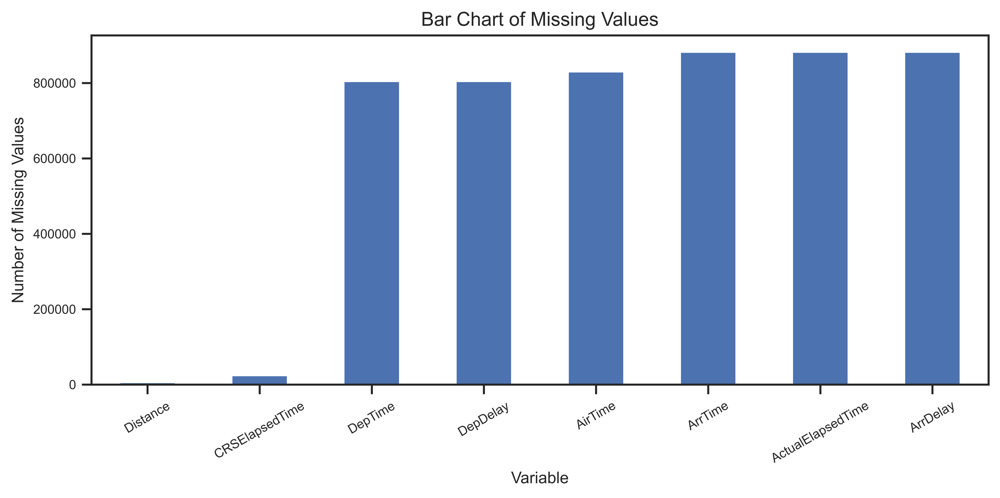

In [10]:
total_obs = flight_data.shape[0]

missing_values.where(missing_values < total_obs).dropna().plot.bar(
    rot = 30,
    fontsize = 8,
    title = "Bar Chart of Missing Values",
    figsize = (10,4))

plt.xlabel("Variable", fontsize = 10)
plt.ylabel("Number of Missing Values", fontsize = 10);

There might be some relationship between the missing values across the variables. Intuitively, canceled or diverted flights might explain the missing values.

Check the number of canceled or diverted flights

In [11]:
flight_data["Cancelled"].value_counts()

0    31882399
1      804514
Name: Cancelled, dtype: int64

In [12]:
((flight_data["Cancelled"]) | (flight_data["Diverted"])).value_counts()

0    31804735
1      882178
dtype: int64

There is a relationship between the number of canceled or diverted flights and the missing values. More specifically, canceled and diverted flight causes missing values in departure and arrival time.

Hence, remove the records with missing values

In [13]:
cancel_divr = flight_data[(flight_data.Cancelled == 1) | (flight_data.Diverted == 1)]
fd_mod = flight_data.drop(cancel_divr.index)

### **Clean and Enrich data**

Drop columns  that provide little to no information for further analysis

In [14]:
fd_mod = fd_mod.drop(
    columns = ["Cancelled", "Diverted", "CancellationCode", "CarrierDelay",
               "WeatherDelay", "NASDelay", "SecurityDelay", "LateAircraftDelay"])

Make modifications to data where necessary:

"DepDel15": binary indicator* for flights with departure delay time >= 15 mins

"ArrDel15": binary indicator* for flights with arrival delay time >= 15 mins

*(0 = not delayed, 1 = delayed)

In [15]:
fd_mod["flight_date"] = fd_mod.Year.astype(str) + "/" + fd_mod.Month.astype(str) + "/" + fd_mod.DayofMonth.astype(str) 

fd_mod["season"] = fd_mod["Month"].apply(lambda x : "Spring" if x in range(3, 6) \
                                          else ("Summer" if x in range(6, 9) \
                                                else ("Autumn" if x in range(9, 12) \
                                                      else "Winter")))

fd_mod["depdel15"] = [1 if x >= 15 else 0 for x in fd_mod.DepDelay]
fd_mod["arrdel15"] = [1 if x >= 15 else 0 for x in fd_mod.ArrDelay]

In [16]:
fd_mod.head()

,Year,Month,DayofMonth,DayOfWeek,DepTime,CRSDepTime,ArrTime,CRSArrTime,UniqueCarrier,FlightNum,TailNum,ActualElapsedTime,CRSElapsedTime,AirTime,ArrDelay,DepDelay,Origin,Dest,Distance,TaxiIn,TaxiOut,flight_date,season,depdel15,arrdel15
0,1995,1,6,5,657.0,645,952.0,937,UA,482,N7298U,115.0,112.0,83.0,15.0,12.0,ORD,PHL,678.0,7,25,1995/1/6,Winter,0,1
1,1995,1,7,6,648.0,645,938.0,937,UA,482,N7449U,110.0,112.0,88.0,1.0,3.0,ORD,PHL,678.0,5,17,1995/1/7,Winter,0,0
2,1995,1,8,7,649.0,645,932.0,937,UA,482,N7453U,103.0,112.0,83.0,-5.0,4.0,ORD,PHL,678.0,3,17,1995/1/8,Winter,0,0
3,1995,1,9,1,645.0,645,928.0,937,UA,482,N7288U,103.0,112.0,84.0,-9.0,0.0,ORD,PHL,678.0,3,16,1995/1/9,Winter,0,0
4,1995,1,10,2,645.0,645,931.0,937,UA,482,N7275U,106.0,112.0,82.0,-6.0,0.0,ORD,PHL,678.0,6,18,1995/1/10,Winter,0,0


Write main data to the database

In [17]:
fd_mod.to_sql("flight_data", con = conn, if_exists = "replace", index = False)

# Write data to csv file (Will be used in Q5)
fd_mod.to_csv("flight_data.csv", index = False)

# **When is it best to fly to minimize delays?**

The columns DepDel15 and ArrDel15 are binary indicators for departure and arrival delays.

The term “delay” in this analysis is classified where time delayed exceeds a grace period of 15 minutes. Despite having late departures, flights may arrive on time. Hence ArrDel15 (arrival delay >= 15) will be used to analyze when is best to fly to minimize delays.

### **General overview of arrival delays**

In [18]:
arrdel_htmap_query = c.execute("""
                               SELECT Year, Month, DayofWeek, flight_date, arrdel15
                               FROM flight_data
                               WHERE arrdel15 == 1
                               """).fetchall()
                               
arrdel_htmap = pd.DataFrame(arrdel_htmap_query)                               
arrdel_htmap.columns = ["year", "month", "dayofweek", "flight_date", "arrdel15"]

arrdel_htmap["flight_date"] = pd.to_datetime(arrdel_htmap["flight_date"])
arrdel_htmap["month"] = arrdel_htmap["flight_date"].dt.month_name().str[: 3]
arrdel_htmap["dayofweek"] = arrdel_htmap["flight_date"].dt.day_name().str[: 3]
arrdel_htmap.set_index("flight_date", inplace = True)

In [19]:
calplot.calplot(arrdel_htmap.arrdel15, cmap = "Reds", colorbar = True)
plt.suptitle("Frequency of Arrival Delays Overview", x = 0.45, y = 1.02 , fontsize = 20);

findfont: Font family ['Helvetica'] not found. Falling back to DejaVu Sans.


The color gradient denotes the number of arrival delays. By observation, September to November has 
the least number of arrival delays.

### **Best Season to travel**

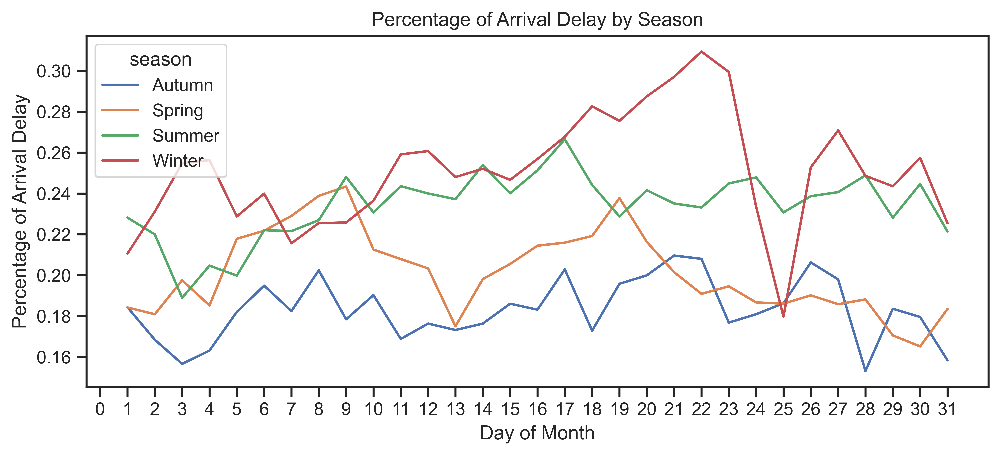

In [20]:
arrdel_dom_query = c.execute("""
                             SELECT DayofMonth, season, AVG(arrdel15)
                             FROM flight_data
                             GROUP BY DayofMonth, season
                             """).fetchall()

arrdel_dom = pd.DataFrame(arrdel_dom_query)
arrdel_dom.columns = ["dayofmonth", "season", "per_del"]

arrdel_dom.pivot(index = "dayofmonth", columns =  "season", values = "per_del").plot.line(
    xticks = range(0,32),
    title = "Percentage of Arrival Delay by Season",
    xlabel = "Day of Month",
    ylabel = "Percentage of Arrival Delay",
    figsize = (10, 4));

Autumn (the most bottom line) has the lowest percentage of flights delayed on arrival and hence is 
the Best Season to fly.

### **Best Month to travel**

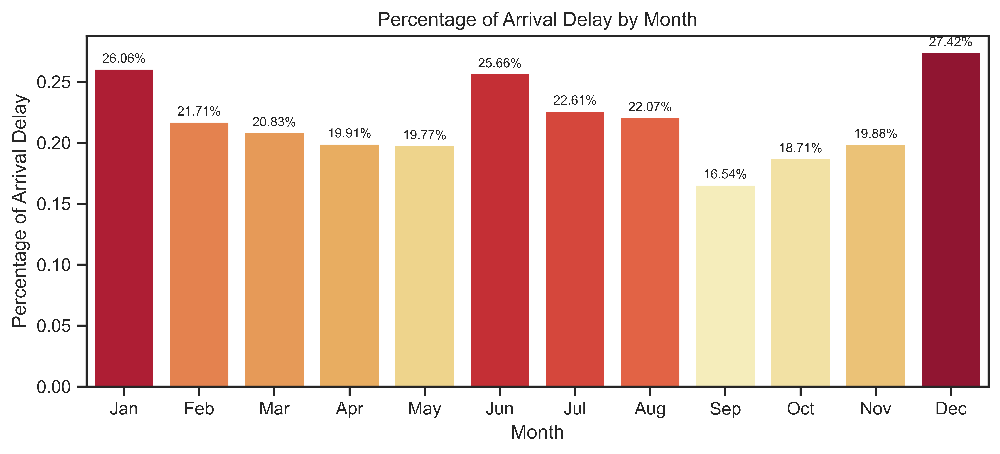

In [21]:
arrdel_mth_query = c.execute("""
                             SELECT Month, AVG(arrdel15)
                             FROM flight_data
                             GROUP BY Month
                             """).fetchall()
                             
arrdel_mth = pd.DataFrame(arrdel_mth_query)
arrdel_mth.columns = ["month", "per_del"]

plt.figure(figsize = (10, 4))
ax = sns.barplot(data = arrdel_mth, x = "month", y = "per_del",
                 dodge = False,
                 hue = "per_del",
                 palette = "YlOrRd")

ax.get_legend().remove()

ax.set(title = "Percentage of Arrival Delay by Month",
       xlabel = "Month",
       ylabel = "Percentage of Arrival Delay",
       xticks = range(0, 12),
       xticklabels = ["Jan", "Feb", "Mar", "Apr", "May", "Jun", "Jul", "Aug", "Sep", "Oct", "Nov", "Dec"]);

for bar in ax.patches:
    anot = round(bar.get_height()*100, 2).astype("str")
    ax.annotate(anot + "%",
                (bar.get_x() + bar.get_width()/ 2, bar.get_height()),
                ha = 'center', va = 'center', 
                size = 8, xytext = (0, 6), 
                textcoords = 'offset points')

The best Month(s) to fly is in May (Spring), September, and October (Autumn), with the probability of 
flights delay on arrival at 19.77%, 16.54%, and 18.71%, respectively.

### **Best Week to travel**

In [22]:
arrdel_wk_query = c.execute("""
                            SELECT Month, flight_date, arrdel15
                            FROM flight_data
                            """).fetchall()
                            
arrdel_wk = pd.DataFrame(arrdel_wk_query)
arrdel_wk.columns = ["month", "flight_date", "arrdel15"]   

arrdel_wk["flight_date"] = pd.to_datetime(arrdel_wk["flight_date"])
arrdel_wk["month"] = arrdel_wk["flight_date"].dt.month_name().str[: 3]
arrdel_wk["weekofmonth"] = [get_week_of_month(x) for x in arrdel_wk.flight_date]

arrdel_wk = arrdel_wk.groupby(["month", "weekofmonth"])["arrdel15"].mean().reset_index()
arrdel_wk.rename(columns = {"arrdel15" : "per_del"}, inplace = True)

sort_order = ["Jan", "Feb", "Mar", "Apr", "May", "Jun", "Jul", "Aug", "Sep", "Oct", "Nov", "Dec"]

arrdel_wk.index = pd.CategoricalIndex(arrdel_wk["month"], categories = sort_order, ordered = True)
arrdel_wk = arrdel_wk.sort_index().reset_index(drop = True)

In [23]:
g = sns.FacetGrid(data = arrdel_wk, col = "month", col_wrap = 4, margin_titles = True)
g.map(sns.barplot, "weekofmonth", "per_del", dodge = False)
g.set_titles(col_template = "{col_name}")
g.fig.subplots_adjust(top = 0.8)
g.fig.suptitle("Percentage of Arrival Delay by Week by Month")
g.set(xlabel = "Week of Month",
      ylabel = "Arrival Delay %")
g.fig.set_size_inches(10, 5);

for ax in g.axes.ravel():
    for bar in ax.patches:
        anot = round(bar.get_height()*100, 2).astype("str")
        ax.annotate(anot + "%",
                    (bar.get_x() + bar.get_width()/ 2, bar.get_height()),
                    ha = 'center', va = 'center', 
                    size = 7, xytext = (0, 6), 
                    textcoords = 'offset points')

During the Autumn season, the first week of the Month is when it is best to fly. Statistically, the 
average percentage of arrival delays in the first week of the Autumn Season is 17.27%.


### **Best Day of week to travel**

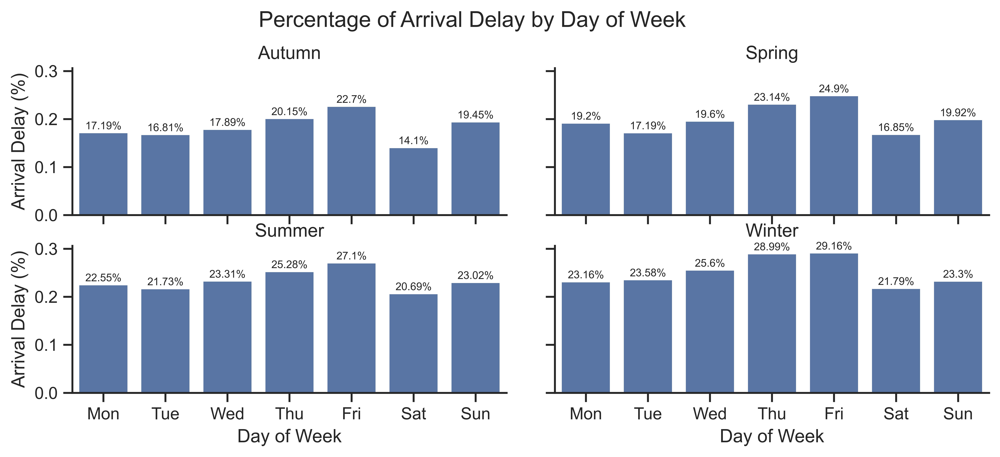

In [24]:
arrdel_dy_query = c.execute("""
                      SELECT DayOfWeek, season, AVG(arrdel15)
                      FROM flight_data
                      GROUP BY DayOfWeek, season
                      """).fetchall()

arrdel_dy = pd.DataFrame(arrdel_dy_query)
arrdel_dy.columns = ["dayofweek", "season", "per_del"]

g = sns.FacetGrid(arrdel_dy, col = "season", col_wrap = 2, margin_titles = True)
g.map(sns.barplot, "dayofweek", "per_del", dodge = False)
g.set_titles(col_template = "{col_name}")
g.fig.subplots_adjust(top = 0.85)
g.fig.suptitle("Percentage of Arrival Delay by Day of Week")
g.set(xlabel = "Day of Week",
      ylabel = "Arrival Delay (%)",
      xticklabels = ["Mon", "Tue", "Wed", "Thu", "Fri", "Sat", "Sun"])
g.fig.set_size_inches(10, 4);

for ax in g.axes.ravel():
    for bar in ax.patches:
        anot = round(bar.get_height()*100, 2).astype("str")
        ax.annotate(anot + "%",
                    (bar.get_x() + bar.get_width()/ 2, bar.get_height()),
                    ha = 'center', va = 'center', 
                    size = 7, xytext = (0, 4),
                    textcoords = 'offset points')

Diving deeper into the best day of the week to fly, the Saturdays of the Autumn season has percentage 
flights delayed on average 14.10%. Generally speaking, Saturdays are the best day of the week to fly 
regardless of the season.

In [25]:
arrdel_dy[arrdel_dy.dayofweek == 6].reset_index(drop = True)

# Summary

,dayofweek,season,per_del
0,6,Autumn,0.141021
1,6,Spring,0.168460
2,6,Summer,0.206892
3,6,Winter,0.217947


### **Best Time to travel**

Taking the "CRSDepTime" (Scheduled Departure Time) and binned every hour as a group. (24 groups in total)

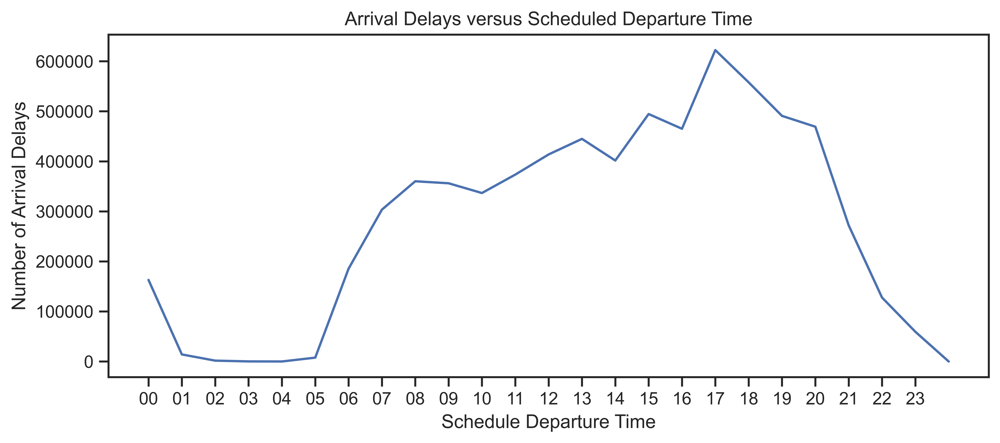

In [26]:
arrdel_tm_query = c.execute("""
                            SELECT CRSDepTime, arrdel15
                            FROM flight_data
                            WHERE arrdel15 == 1
                            """).fetchall()
                            
arrdel_tm = pd.DataFrame(arrdel_tm_query)
arrdel_tm.columns = ["crsdeptime", "arrdel15"]

# Pad leading zeros
arrdel_tm["crsdeptime"] = arrdel_tm["crsdeptime"].apply("{0:-04d}".format)

# Create categorical variable, "time_bin"
time_bin = []
for x in arrdel_tm["crsdeptime"]:
    hour = x[:2]
    time_bin.append(hour)
    
time_bin = pd.DataFrame(time_bin)

arrdel_tm = arrdel_tm.merge(time_bin, left_index = True, right_index = True)
arrdel_tm.rename(columns = {0 : "time_bin"}, inplace = True)

arrdel_tm.groupby("time_bin")["arrdel15"].sum().plot.line(
    x = "time_bin",
    xticks = range(0, 24),
    title ="Arrival Delays versus Scheduled Departure Time",
    xlabel = "Schedule Departure Time",
    ylabel = "Number of Arrival Delays",
    figsize = (10,4));

By observation, flight delays were low in the early morning and increased after 10:00 hours. Between 17:00 - 20:00 has the highest number of flights delayed, with the numbers declining towards midnight.

Reduce the odds of flight delays by flying in the morning and avoiding flights that depart during 16:00 - 19:00 hours.

# **Do older planes suffer more delays than newer planes?**

There are multiple factors besides its chronological age to consider when evaluating the age of a plane. This analysis will take 11 years, the average age of a U.S. commercial aircraft as a guide for “old” planes.

"neg_age": proxy variable for filtering invalid plane ages

"age": dummy variable for age of the planes (0 = old planes, 1 = new planes.)

In [27]:
plane_date_query = c.execute("""
                             SELECT flight_date, issue_date, arrdel15
                             FROM (plane_data LEFT JOIN flight_data 
                                   ON plane_data.tailnum = flight_data.TailNum)
                             WHERE arrdel15 >= 0
                             """).fetchall()

plane_date = pd.DataFrame(plane_date_query)
plane_date.columns = ["flight_date", "issue_date", "arrdel15"]

# Coerce dates to datetime class
plane_date["flight_date"] = pd.to_datetime(plane_date["flight_date"])
plane_date["issue_date"] = pd.to_datetime(plane_date["issue_date"], 
                                          format = "%m/%d/%Y", 
                                          errors = "coerce")

# Compute difference between "flight_date" and "issue_date"
time_diff = (plane_date["flight_date"] - plane_date["issue_date"])
  
plane_date["neg_age"] = [None if x < 0 else 1 for x in (time_diff / np.timedelta64(1, "Y"))]
plane_date["age"] = [1 if x <= 11 else 0 for x in (time_diff / np.timedelta64(1, "Y"))]

plane_date.dropna(inplace = True)

print(plane_date)

         flight_date issue_date  arrdel15  neg_age  age
0         1995-01-02 1992-04-10         0      1.0    1
1         1995-01-03 1992-01-06         1      1.0    1
2         1995-01-07 1992-05-27         0      1.0    1
3         1995-01-08 1987-03-27         0      1.0    1
4         1995-01-09 1991-08-07         0      1.0    1
...              ...        ...       ...      ...  ...
12016898  2000-12-09 1999-12-14         0      1.0    1
12016899  2000-12-10 1999-12-14         0      1.0    1
12016900  2000-12-11 1991-04-19         0      1.0    1
12016901  2000-12-12 1990-09-28         1      1.0    1
12016902  2000-12-13 1991-04-19         0      1.0    1

[7337291 rows x 5 columns]


### Re: *Do older planes suffer more delays than newer plane?*

Create a contingency table


In [28]:
obsvtn = plane_date[["arrdel15", "age"]].reset_index(drop = True)

obsvtn["age"] = ["old" if x == 0 else "new" for x in obsvtn.age]
obsvtn["status"] = ["On-time" if x == 0 else "Delayed" for x in obsvtn.arrdel15]

xtbl_count = pd.crosstab(obsvtn["status"], obsvtn["age"], margins = True)

print(xtbl_count)

age          new     old      All
status                           
Delayed  1430375  198162  1628537
On-time  5009140  699614  5708754
All      6439515  897776  7337291


In [29]:
# Column percentages
xtbl_count.rename(index = {"All": "coltotal"}, inplace = True)
xtbl_per = (xtbl_count/xtbl_count.loc["coltotal"]*100).round(2)

xtbl_per.drop(columns = "All", index = "coltotal", inplace = True)

Visualize the information on a side-by-side bar chart

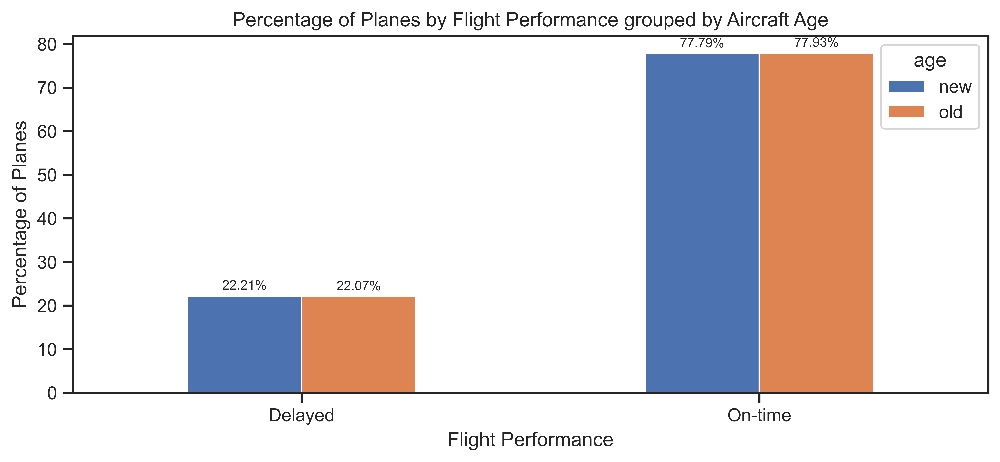

In [30]:
ax = xtbl_per.plot.bar(rot = 0, 
                       title = "Percentage of Planes by Flight Performance grouped by Aircraft Age",
                       xlabel = "Flight Performance",
                       ylabel = "Percentage of Planes",
                       figsize = (10, 4));

for bar in ax.patches:
    anot = round(bar.get_height(), 2).astype("str")
    ax.annotate(anot + "%",
                (bar.get_x() + bar.get_width()/ 2, bar.get_height()),
                ha = 'center', va = 'center', 
                size = 8, xytext = (0, 6), 
                textcoords = 'offset points')

Based on the visualization, there appears to be no association between the plane age and flight performance. To further confirm this result, we check for any statistical significance between the plane age and flight performance using the Chi-square test for association.

### **Chi-square test for association**

H0: There is no association between plane age and flight performance

H1: There is such an association

In [31]:
# Define the data
xtbl_count.drop(columns = "All", index = "coltotal", inplace = True)
stat, p, dof, expected = chi2_contingency(xtbl_count)
  
# Interpreting the p-value
a = 0.05
print("p-value is " + str(p))
if p <= a:
    print('Reject H0')
else:
    print('H0 is not rejected')

p-value is 0.002813509411296891
Reject H0


As the p-value = 0.28%, the null hypothesis is rejected at the 1% significance level. The results are highly significant and provide strong evidence for rejecting the null hypothesis to conclude an association between plane age and flight performance.

Although the plane age and flight performance are statistically significant, its graphical visualization for the association is similar for both the age group, with only a 0.14% difference.

In conclusion, the association between plane age and flight performance is small, consistent, and biologically insignificant. Hence, it is unlikely that older planes do suffer from more delays.

# **How does the number of people flying between different locations change over time?**

There is no information on the number of passengers abroad on each plane. Hence, the number of flights is used as a proxy for the indication of popularity.

Check the airport with the most outbound flights

In [32]:
fd_routes_query = c.execute("""
                            SELECT Year, Month, season, Origin, Dest
                            FROM flight_data
                            """).fetchall()

fd_routes = pd.DataFrame(fd_routes_query)
fd_routes.columns = ["year", "month", "season", "origin", "dest"]

fd_routes["route"] = fd_routes.origin + "-" + fd_routes.dest

fd_routes.groupby("year")["origin"]\
    .value_counts()\
    .sort_values(ascending = False)\
    .head(10)

year  origin
1997  ORD       288700
1995  ORD       286702
1996  ORD       285788
1998  ORD       284627
1999  ORD       281558
2000  ORD       276714
1995  DFW       263186
1999  ATL       256521
2000  ATL       255858
1998  ATL       250001
Name: origin, dtype: int64

ORD - Chicago O’Hare International airport has the highest number of outbound flights and hence is used as the sampling frame for this analysis.

### **Multiple Time Series Chart - Number of Outbound Flights from ORD airport over Time by Destination**

In [33]:
fd_routes["date"] = fd_routes.year.astype(str) + "-" + fd_routes.month.astype(str)

fd_routes = fd_routes[fd_routes.origin == "ORD"]\
    .groupby("date")["route"]\
    .value_counts()\
    .reset_index(name = "counts")

In [34]:
g = sns.FacetGrid(fd_routes, col = "route", col_wrap = 13, margin_titles = True)
g.map(sns.lineplot, "date", "counts")
g.fig.subplots_adjust(top = 0.93)
g.fig.suptitle("Number of Outbound Flights from ORD airport by Destination", fontsize = 20.0)
g.set_titles(col_template = "{col_name}")
g.set(xlabel = "Date", 
      ylabel = "Number of Flights")
g.fig.set_size_inches(15, 15);

The visualization illustrates the trend of outgoing flights from ORD (Chicago) over the years, from 1995 to 2000 (left to right). The majority of the routes showed consistent trends.

Flights from Chicago to Minneapolis (ORD-MSP) have been consistently decreasing over the years, and flights from Chicago to Philadelphia (ORD-PHL) have been increasing. Meanwhile, flights to Seattle (ORD-SEA) are low at the beginning and end of each year and highest mid-year.

This result is exclusively for flights outbound from ORD airport, which does not make a good representation of all the airports. However, the same analysis using different origin airports of interest can be re-performed to uncover the flight patterns for the airport.

# **Can you detect cascading failures as delays in one airport create delays in others?**

Analyze for cascading delays between the top 10 busiest airports in the USA in terms of flight frequency.

Flight frequency for the top 10 busiest airports/ cities

In [35]:
bz_airports_query = c.execute("""
                              SELECT Origin, city, COUNT(*) as count
                              FROM flight_data, airports
                              WHERE airports.iata = flight_data.Origin
                              GROUP BY Origin, city
                              ORDER BY count DESC
                              Limit 10
                              """).fetchall()

bz_airports = pd.DataFrame(bz_airports_query)
bz_airports.columns = ["iata", "airport_city", "counts"]

print(bz_airports)

  iata       airport_city   counts
0  ORD            Chicago  1704089
1  ATL            Atlanta  1472688
2  DFW  Dallas-Fort Worth  1464427
3  LAX        Los Angeles  1106365
4  STL           St Louis  1023369
5  PHX            Phoenix  1006169
6  DTW            Detroit   882485
7  MSP        Minneapolis   812323
8  DEN             Denver   789971
9  SFO      San Francisco   786089


"delay_lag": lag 1-period departure delay time

In [36]:
delay_lag_query = c.execute("""
                      SELECT Origin, Dest, CRSDepTime, DepTime, DepDelay
                      FROM flight_data
                      WHERE CRSDepTime > 1900
                      AND CRSDepTime <= 2200
                      ORDER BY Origin, DepTime
                      """).fetchall()

delay_lag = pd.DataFrame(delay_lag_query)
delay_lag.columns = ["origin", "dest", "crsdeptime", "deptime", "depdelay"] 

delay_lag["depdelay_lag"] = delay_lag.groupby("origin")["depdelay"].shift(1)
delay_lag.dropna(inplace = True)
delay_lag.reset_index(drop = True, inplace = True)
    
print(delay_lag)

        origin dest  crsdeptime  deptime  depdelay  depdelay_lag
0          ABE  MDT        2030     39.0     249.0         244.0
1          ABE  MDT        2030     47.0     257.0         249.0
2          ABE  DTW        2005   1400.0    1075.0         257.0
3          ABE  MDT        1915   1908.0      -7.0        1075.0
4          ABE  MDT        1915   1909.0      -6.0          -7.0
...        ...  ...         ...      ...       ...           ...
4157492    TYS  ATL        2100   2324.0     144.0         231.0
4157493    TYS  ATL        2040   2326.0     166.0         144.0
4157494    TYS  ATL        1925   2326.0     241.0         166.0
4157495    TYS  ATL        1940   2338.0     238.0         241.0
4157496    TYS  ATL        1930   2345.0     255.0         238.0

[4157497 rows x 6 columns]


### **Relationship between the average delay against time delayed for all the previous flight**

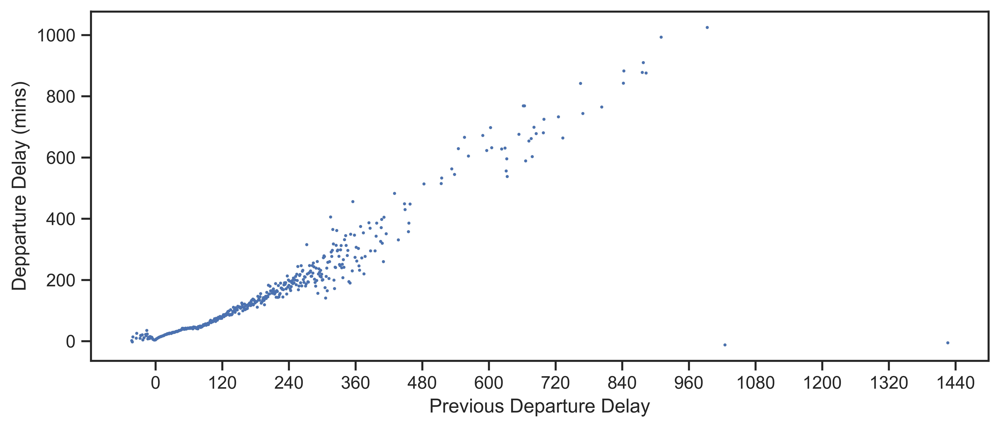

In [37]:
delay_lag_ORD = delay_lag[delay_lag.origin == "ORD"].reset_index(drop = True)
delay_lag_ORD = delay_lag_ORD.groupby("depdelay_lag")["depdelay"].mean()\
    .reset_index(name = "depdelay_mean")

delay_lag_ORD.plot.scatter(s = 0.8,
                           x = "depdelay_lag", 
                           y = "depdelay_mean",
                           xticks = range(0, 1500, 120),
                           xlabel = "Previous Departure Delay",
                           ylabel = "Depparture Delay (mins)",
                           figsize = (10, 4));

The above scatter diagram illustrates the relationship (positive) between the previous delay and the subsequent flights' departure delay time (avg.) for flights outbound from Chicago O’Hare International airport between 19:00 – 22:00 hours.

Indicated by the increase in variability, the strength of the relationship cools off around the 480 (mins) mark. Suggesting that flights' ability to depart on time increases with the duration delayed for the previous flight since flights with longer delays can intersperse with flights leaving on time.

### **Cascading delays for top 10 busiest airports**

In [38]:
delay_lag["bz_indicator"] = delay_lag.origin.isin(bz_airports.iata)
delay_lag_bz = delay_lag[delay_lag.bz_indicator == True]    

delay_lag_bz = delay_lag_bz.groupby(["origin", "depdelay_lag"])["depdelay"].mean()\
    .reset_index(name = "depdelay_mean")

g = sns.FacetGrid(delay_lag_bz, col = "origin", col_wrap = 2, margin_titles = True)
g.map(sns.scatterplot, "depdelay_lag", "depdelay_mean", s = 7.5)
g.set_titles(col_template = "{col_name}")
g.set(xticks = range(-750, 1500, 120),
      xlabel = "Previous Departure Delay",
      ylabel = "Departure Delay (mins)")
g.fig.set_size_inches(17, 10);

Since flight schedules are aligned between the origin and destination of a flight, the impact of cascading delays in one airport on another airport can be interpreted implicitly through the relationship between previous delays and the subsequent flights’ departure delay time.

In [39]:
conn.close()